In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [45]:
def to_homogeneous_coords(het_coords):
  hom_coords = np.ones((3, het_coords.shape[1]))
  for i in range(0, hom_coords.shape[1]):
    hom_coords[:2, i] = het_coords[:2, i]
  return hom_coords

def to_heterogeneous_coords(hom_coords):
  return np.divide(hom_coords[:,:2], hom_coords[:,[-1]])


In [16]:
outline1 = np.float32([[0,0], [4, 0], [4, 3], [0, 3]])
outline2 = np.float32([[0,0], [4, 0], [4, 3], [0, 3]]) 
H = np.array([[1, 0, 2], [0, 1, 1], [0, 0, 1]])

print(outline1)
outline1_h = to_homogeneous_coords(np.transpose(outline1))
print(outline1_h)

outline1_warped_h = np.transpose(H @ outline1_h)
print(outline1_warped_h)
outline1_warped = to_heterogeneous_coords(outline1_warped_h)
print(outline1_warped)
outline_stack = np.concatenate((outline1_warped, outline2), axis=0)
print (outline_stack)

[[0. 0.]
 [4. 0.]
 [4. 3.]
 [0. 3.]]
[[0. 4. 4. 0.]
 [0. 0. 3. 3.]
 [1. 1. 1. 1.]]
[[2. 1. 1.]
 [6. 1. 1.]
 [6. 4. 1.]
 [2. 4. 1.]]
[[2. 1.]
 [6. 1.]
 [6. 4.]
 [2. 4.]]
[[2. 1.]
 [6. 1.]
 [6. 4.]
 [2. 4.]
 [0. 0.]
 [4. 0.]
 [4. 3.]
 [0. 3.]]


In [ ]:
def estimateTransform(img1, img2, model, method):
    img1_gray = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
    img2_gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

    if method == 0:
        # Initiate SIFT detector
        met_type = cv.SIFT_create()
    elif method == 1:
        # Initiate ORB detector
        met_type = cv.ORB_create()
    else:
        raise ValueError('Method must be 0 (SIFT) or 1 (ORB)')
    
    # find the keypoints and descriptors
    kp1, des1 = met_type.detectAndCompute(img1_gray, None)
    kp2, des2 = met_type.detectAndCompute(img2_gray, None)

    # create BFMatcher object
    bf = cv.BFMatcher()

    # Match descriptors.
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test
    good_ratio = []
    for m, n in matches:
        if m.distance < 0.8*n.distance:
            good_ratio.append([m])

    # Extract location of good matches
    matches = good_ratio
    src_points = np.zeros((len(matches), 2), dtype=np.float32)
    dst_points = np.zeros((len(matches), 2), dtype=np.float32)
    
    for i, match in enumerate(matches):
        src_points[i, :] = kp1[match[0].queryIdx].pt
        dst_points[i, :] = kp2[match[0].trainIdx].pt

    if len(matches) < 4:
        raise ValueError('Not enough matches to compute homography')

    
    match model:
        case 0:
            H, mask = cv.findHomography(src_points, dst_points, cv.RANSAC)
        case 1: 
            H, mask = cv.estimateAffine2D(src_points, dst_points, cv.RANSAC)
            H = to_homogeneous_coords(H)
        case 2:
            H, mask = cv.estimateAffinePartial2D(src_points, dst_points, cv.RANSAC)
            H = to_homogeneous_coords(H)
        case _:
            raise ValueError('Model must be homography, affine or similarity')

    
    # Get only inliers
    ransac_inliers = []
    for i, m in enumerate(matches):
        if mask[i]==1:
            ransac_inliers.append(m)
    
    img_match_thr = cv.drawMatchesKnn(img1, kp1, img2, kp2, ransac_inliers, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    plt.figure(figsize=(20, 20), dpi=80)
    plt.imshow(img_match_thr)
    plt.show()

    
    
    
    return H




In [57]:
def warpImages(img1, img2, H):
  
  h1, w1 = img1.shape[:2]
  h2, w2 = img2.shape[:2]

  outline1 = np.float32([[0,0], [w1, 0], [w1, h1], [0, h1]])
  outline2 = np.float32([[0,0], [w2, 0], [w2, h2], [0, h2]])

  print(outline1)
  outline1_h = to_homogeneous_coords(np.transpose(outline1))

  # When we have established a homography we need to warp perspective
  # Change field of view
  outline1_warped_h = np.transpose(H @ outline1_h)

  outline1_warped = to_heterogeneous_coords(outline1_warped_h)

  outline_stack = np.concatenate((outline1_warped, outline2), axis=0)

  [x_min, y_min] = outline_stack.min(axis=0)
  [x_max, y_max] = outline_stack.max(axis=0)

  h_out = np.int32(y_max - y_min)
  w_out = np.int32(x_max - x_min)
  
  T = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]])

  mask1 = np.ones_like(img1)
  mask2 = np.ones_like(img2)

  img1_warped = cv.warpPerspective(img1,T@H, (w_out, h_out))
  mask1 = cv.warpPerspective(mask1,T@H, (w_out, h_out))

  img2_warped = cv.warpPerspective(img2,  T, (w_out, h_out))
  mask2 = cv.warpPerspective(mask2,  T, (w_out, h_out))

  output_img = np.zeros((h_out, w_out, 3))

  output_img[mask1>0] = img1_warped[mask1>0]
  output_img[mask2>0] = img2_warped[mask2>0]

  return output_img
    

In [91]:
def stichImages(img, H):

    num_of_images = len(img)

    outline_in = []
    outline_in_h = []

    for i in range(0, num_of_images):
        h, w = img[i].shape[:2]
        outline_in.append(np.array([[0, 0], [w-1, 0], [w-1, h-1], [0, h-1]], dtype=np.float32))
        outline_in_h.append(np.array([[0, 0, 1], [w-1, 0, 1], [w-1, h-1, 1], [0, h-1, 1]], dtype=np.float32))

    outline_out = np.zeros_like(outline_in)
    outline_out_h = np.zeros_like(outline_in_h)

    for i in range(0, num_of_images):
        outline_out_h[i] = np.transpose(H[i] @ np.transpose(outline_in_h[i]))
        outline_out[i] = np.divide(outline_out_h[i][:,:2], outline_out_h[i][:,[-1]])

    out_x_min, out_y_min = (outline_out.min(axis=0)).min(axis=0)
    out_x_max, out_y_max = (outline_out.max(axis=0)).max(axis=0)

    print(out_x_min, out_y_min, out_x_max, out_y_max)

    width_out = np.int32(out_x_max - out_x_min)
    height_out = np.int32(out_y_max - out_y_min)

    print(width_out, height_out)

    T = np.array([[1, 0, -out_x_min],
                [0, 1, -out_y_min],
                [0, 0,          1]], dtype=np.float32)

    for i in range(0, num_of_images):
        outline_out[i][:] = outline_out[i][:] - [out_x_min, out_y_min]

    outline_out_img = np.zeros((height_out, width_out, 3))
    output_img = np.zeros((height_out, width_out, 3))

    for i in range(0, num_of_images):
        outline_out_img = cv.polylines(outline_out_img,[np.int32(outline_out[i])], True, 255, 3)
        mask = np.ones_like(img[i])
        mask = cv.warpPerspective(mask, T@H[i], (width_out, height_out))
        temp = cv.warpPerspective(img[i], T@H[i], (width_out, height_out))
        output_img[mask>0] = temp[mask>0]

    return output_img  

In [92]:
def H_recursive(H, dst_img_idx, ind, i):
    if ind[i] == 1:
        #print(str(i) + '@', end='')
        #print(np.shape(H[i]))
        return H[i]
    else:
        ind[i] = 1
        H[i] = H_recursive(H, dst_img_idx, ind, dst_img_idx[i]) @ H[i]
        return H[i]

In [93]:
def createPanorama(img, dst_img_idx, model, method):
    H = []
    Ind = np.zeros(len(img), dtype=np.int32)
    num_of_images = len(img)
    
    for i in range(0, num_of_images):
        if i == dst_img_idx[i]:
            Ind[i] = 1
            H.append(np.eye(3))
        else:
            H.append(estimateTransform(img[i], img[dst_img_idx[i]], model, method))
            print(H[i])


    #calculate homographies to the destination image recursively
    """
    for i in range(0, num_of_images):
        H[i] = H_recursive(H, dst_img_idx, Ind, i)
    
    """
    return H
    

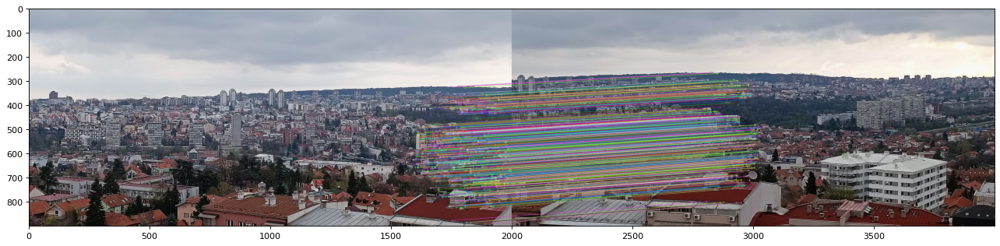

[[ 9.20682832e-01  8.06656226e-03 -8.12384928e+02]
 [-3.31044383e-02  9.53068510e-01  1.82852999e+01]
 [ 1.00000000e+00  1.00000000e+00  1.00000000e+00]]


In [94]:
img = []
dst_img_idx1 = [1, 1]
#dst_img_idx2 = [1, 2, 2, 0]

for i in range(0, 2):
	img.append(cv.imread('imgs/pano_real/pano' + str(i + 1) + '.jpg'))
	img[i] = cv.cvtColor(img[i], cv.COLOR_BGR2RGB)
	
H1 = createPanorama(img, dst_img_idx1, 1, 0)
#H2 = createPanorama(img, dst_img_idx2, 0, 0)

#output_img = stichImages(img, H)




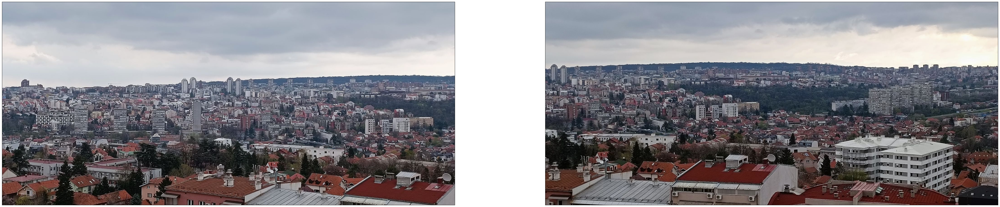

-812.38495 -0.023945237 1999.0 899.0
2811 899


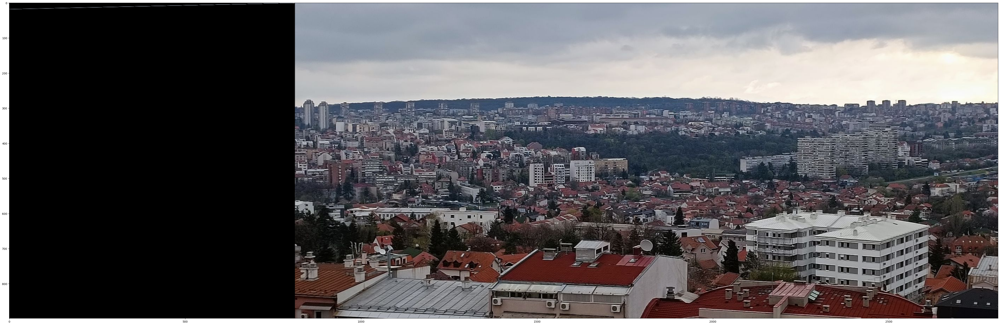

"\nfig, axs = plt.subplots(figsize=(64,64))\nplt.imshow(output_img2.astype('uint8'))\nplt.show()\n"

In [95]:
fig, axs = plt.subplots(1, 2, figsize=(64,64))
for i in range(0,2):
	axs[i].imshow(img[i])
	axs[i].get_xaxis().set_visible(False)
	axs[i].get_yaxis().set_visible(False)
plt.show()

output_img1 = stichImages(img, H1)
#output_img2 = stichImages(img, H2)

fig, axs = plt.subplots(figsize=(64,64))
plt.imshow(output_img1.astype('uint8'))
plt.show()
"""
fig, axs = plt.subplots(figsize=(64,64))
plt.imshow(output_img2.astype('uint8'))
plt.show()
"""

[[0. 0.]
 [4. 0.]
 [4. 3.]
 [0. 3.]]
[[0. 4. 4. 0.]
 [0. 0. 3. 3.]
 [1. 1. 1. 1.]]
